myenv\Scripts\activate

In [14]:
from deepface import DeepFace
import os
import pandas            as pd
import cv2
import matplotlib.pyplot as plt
import tensorflow        as tf

In [15]:
print(tf.__version__)
print(DeepFace.__version__)

2.18.0
0.0.93


In [16]:
images_path = "Dataset_faces/faces_lecture"

In [17]:
img_path = "Dataset_faces/faces_lecture/face17.png"

# AGE DETECTION

In [18]:
DeepFace.analyze(img_path=img_path,
                 actions=['age'])

[{'age': 32,
  'region': {'x': 307,
   'y': 396,
   'w': 1408,
   'h': 1408,
   'left_eye': (1235, 958),
   'right_eye': (723, 959)},
  'face_confidence': 0.91}]

In [19]:
# To save
result = DeepFace.analyze(img_path=img_path,
                          actions=['age'])

In [20]:
def visualize_attribute(img_path, result, attribute="age"):
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    if attribute in result[0]:
        prediction = result[0][attribute]
        text = f"{attribute}: {prediction}"
    else:
        text = f"{attribute}: not found in result"
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1.5
    thickness = 2
    color = (255,255,255)
    shadow_color = (0,0,0)
    
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(text)
    plt.show()
    

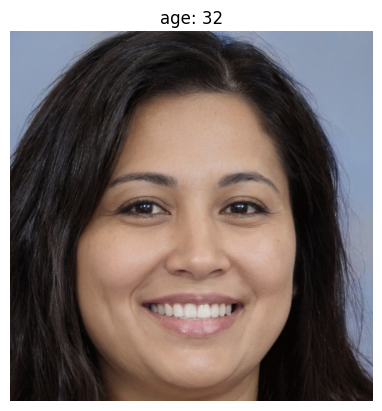

In [21]:
visualize_attribute(img_path=img_path,
                    result=result,
                    attribute="age")

In [22]:
#To make every images
images_paths = [os.path.join(images_path, f) for f in os.listdir(images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

In [23]:
images_paths

['Dataset_faces/faces_lecture\\face11.png',
 'Dataset_faces/faces_lecture\\face12.png',
 'Dataset_faces/faces_lecture\\face13.png',
 'Dataset_faces/faces_lecture\\face14.png',
 'Dataset_faces/faces_lecture\\face15.png',
 'Dataset_faces/faces_lecture\\face16.png',
 'Dataset_faces/faces_lecture\\face17.png',
 'Dataset_faces/faces_lecture\\face18.png',
 'Dataset_faces/faces_lecture\\face19.png',
 'Dataset_faces/faces_lecture\\face20.png']

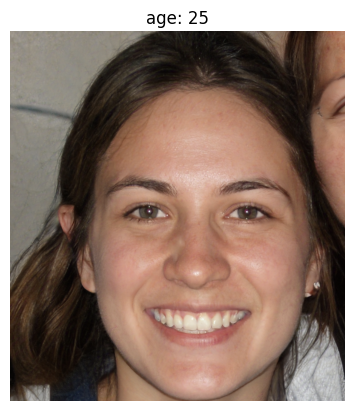

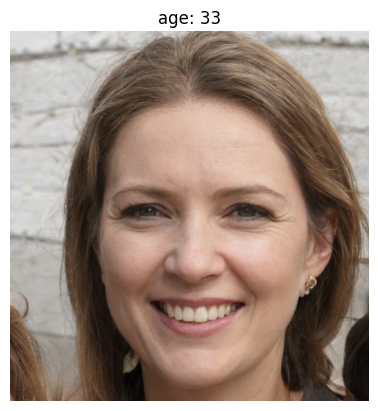

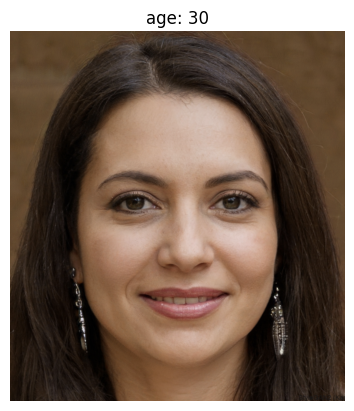

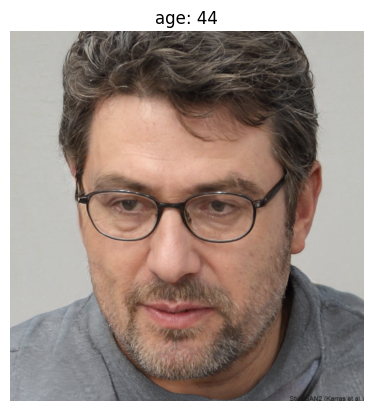

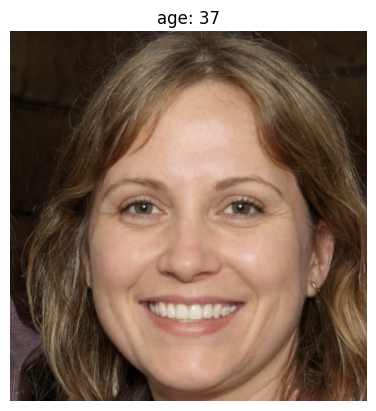

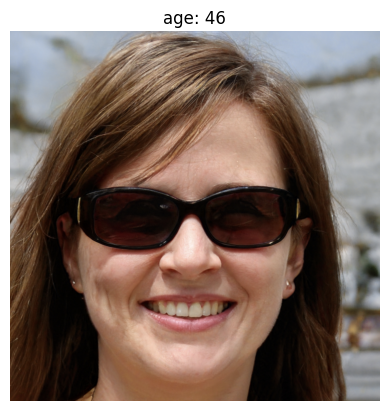

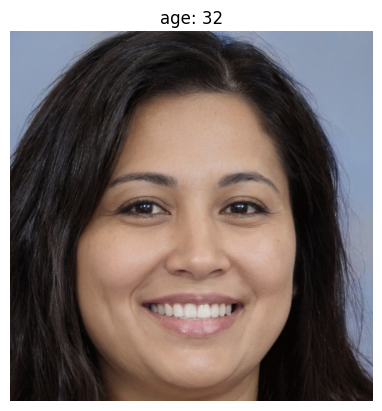

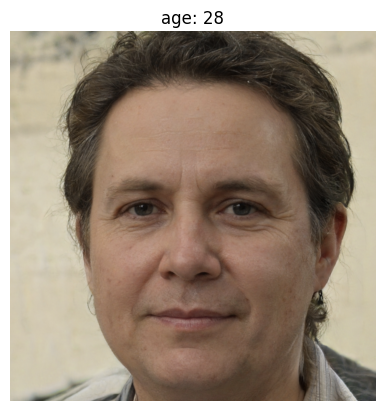

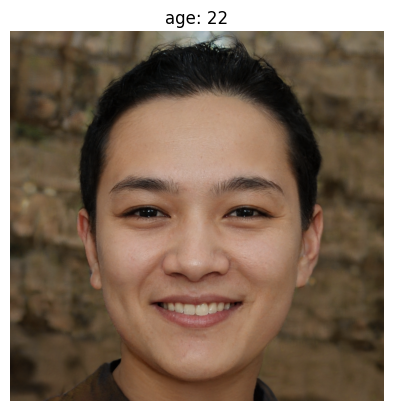

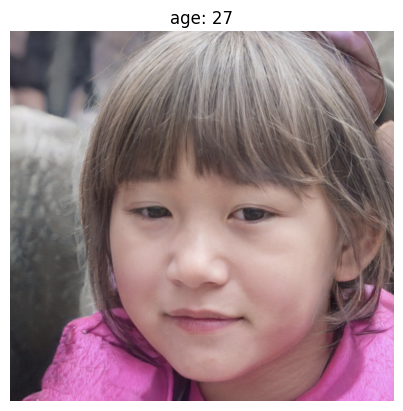

In [24]:
for path in images_paths:
    result = DeepFace.analyze(img_path=path,
                          actions=['age'])
    visualize_attribute(img_path=path,
                    result=result,
                    attribute="age")

# GENDER DETECTION

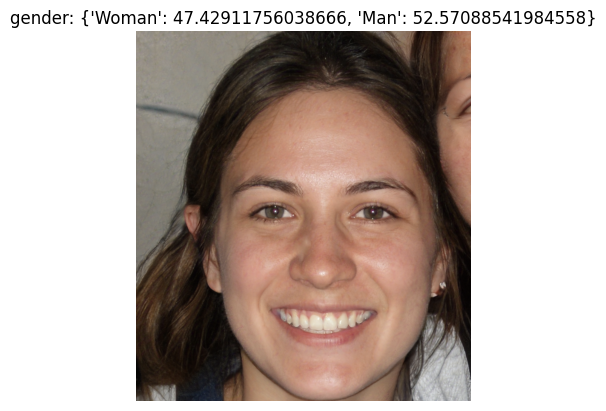

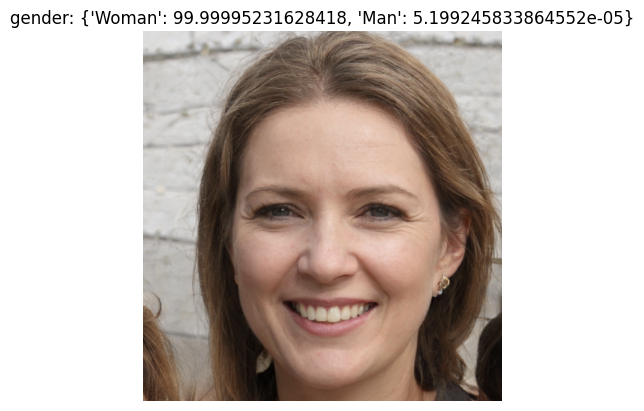

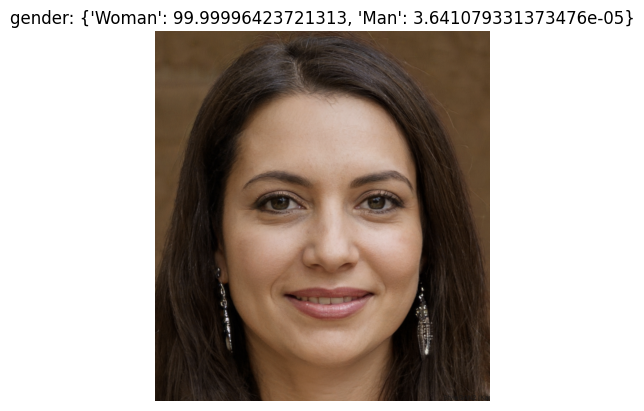

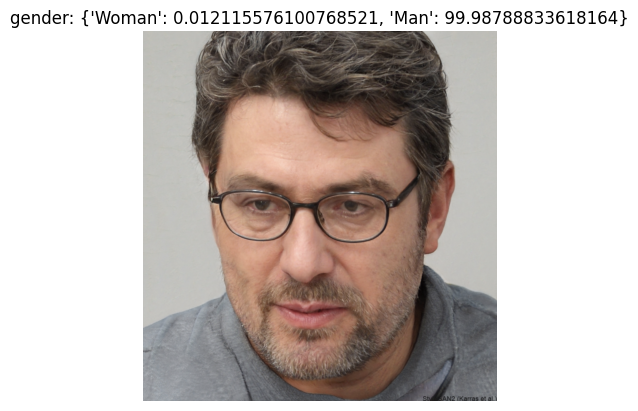

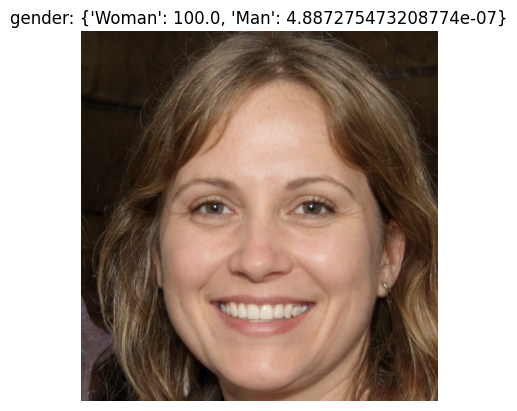

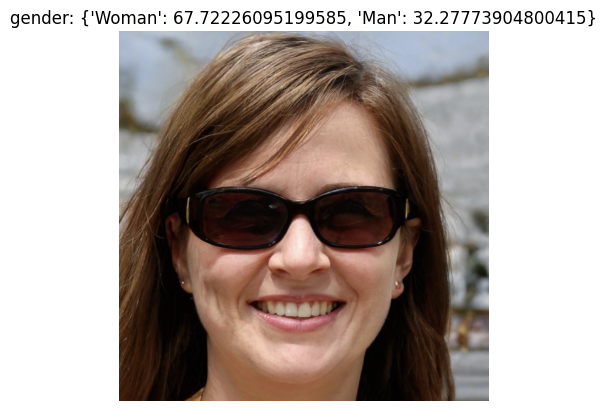

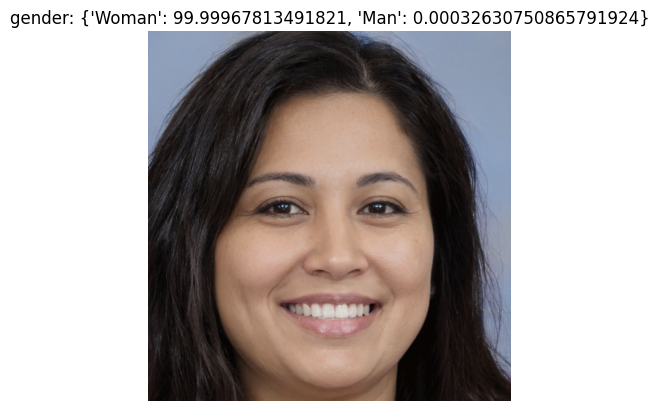

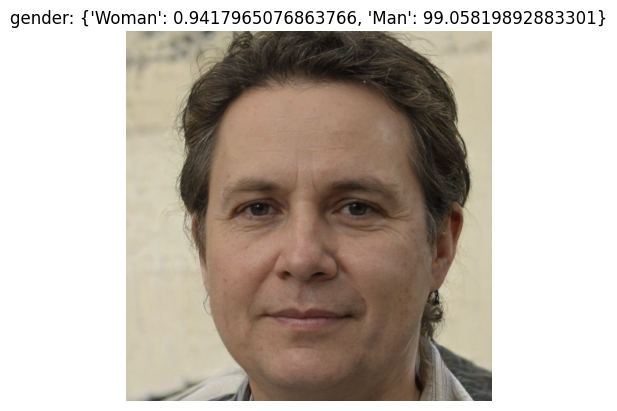

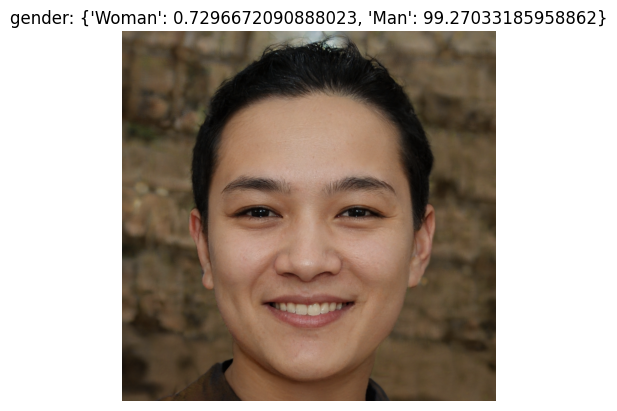

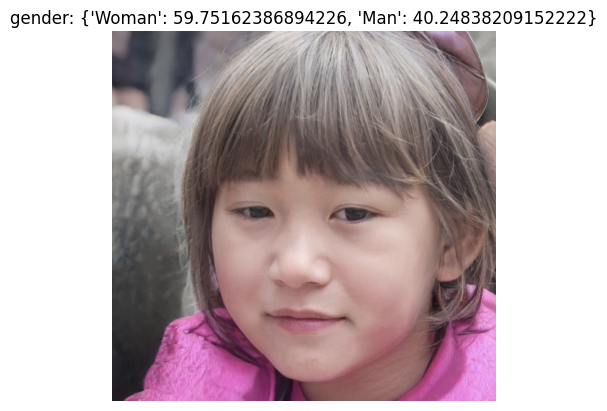

In [25]:
for path in images_paths:
    result = DeepFace.analyze(img_path=path,
                          actions=['gender'])
    visualize_attribute(img_path=path,
                    result=result,
                    attribute="gender")

# RACE DETECTION

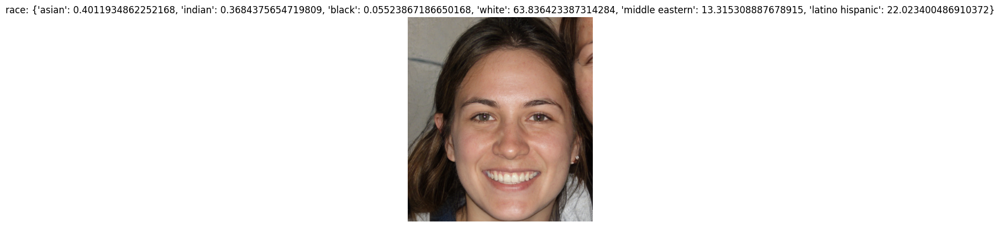

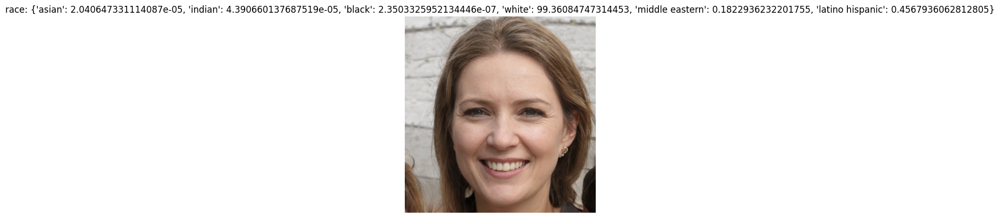

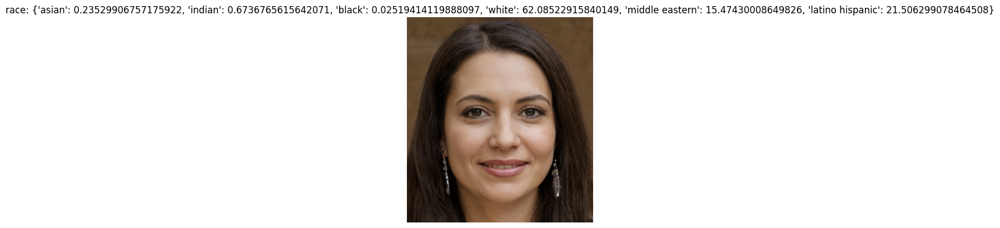

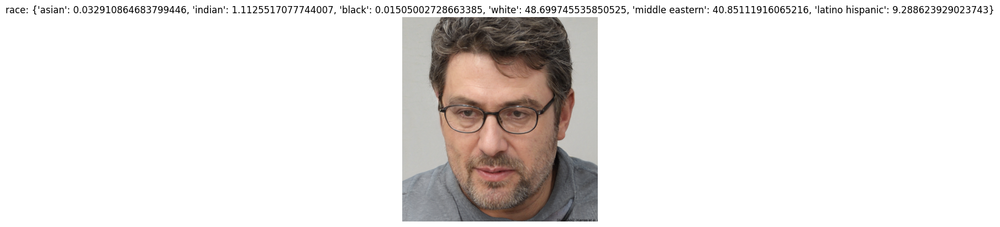

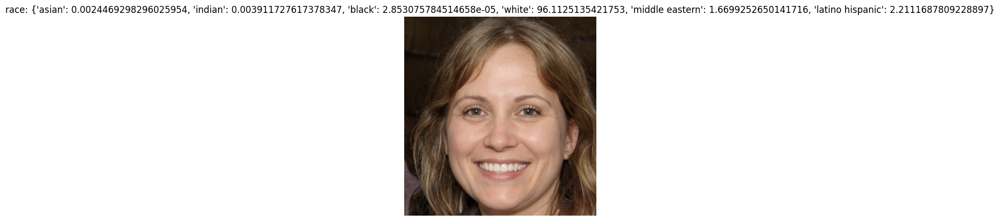

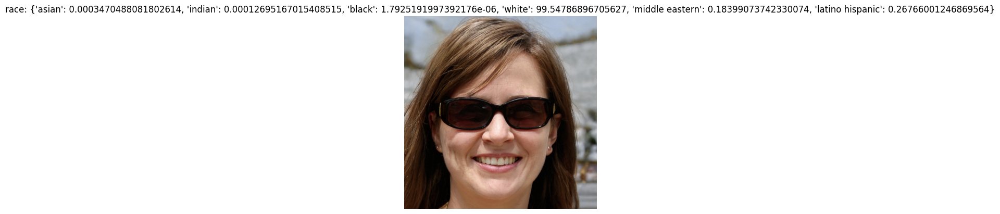

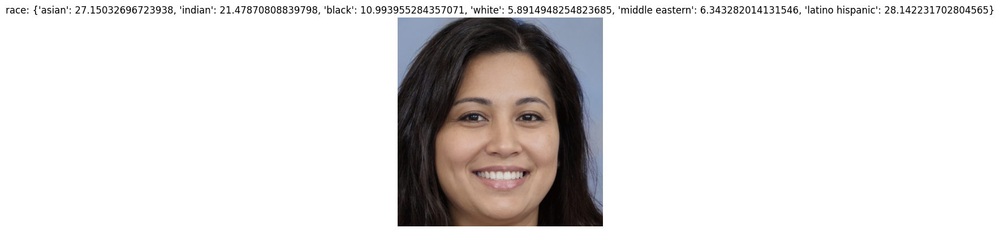

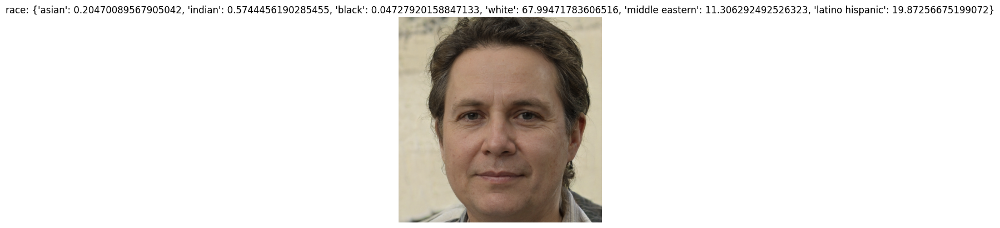

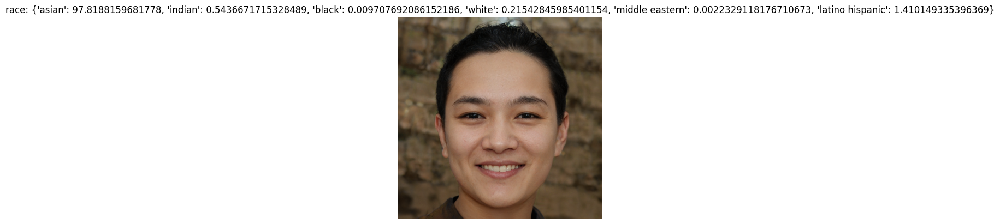

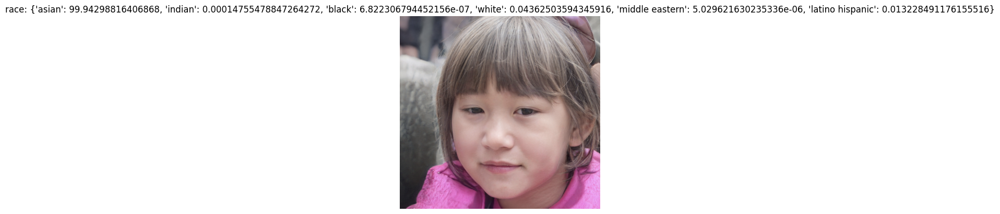

In [26]:
for path in images_paths:
    results = DeepFace.analyze(img_path=path,
                          actions=['race'])
    visualize_attribute(img_path=path,
                        result=results,
                        attribute="race")

In [27]:
result

[{'gender': {'Woman': 59.75162386894226, 'Man': 40.24838209152222},
  'dominant_gender': 'Woman',
  'region': {'x': 355,
   'y': 503,
   'w': 1290,
   'h': 1290,
   'left_eye': (1236, 962),
   'right_eye': (751, 941)},
  'face_confidence': 0.93}]

# EMOTION DETECTION

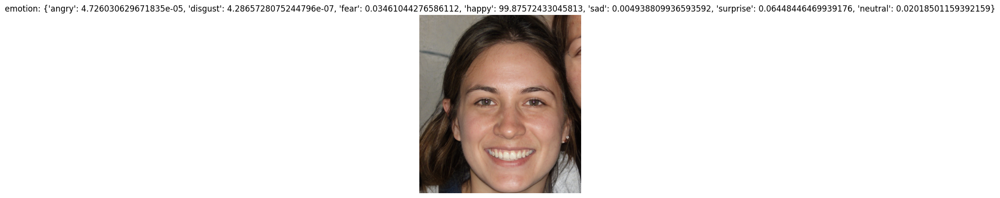

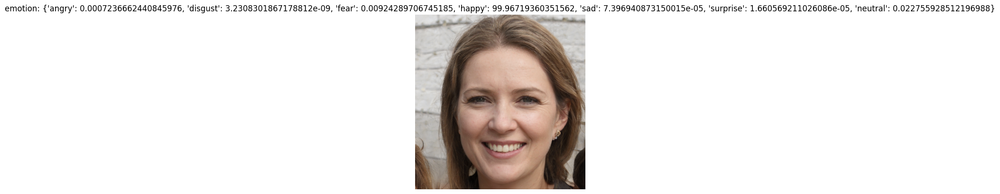

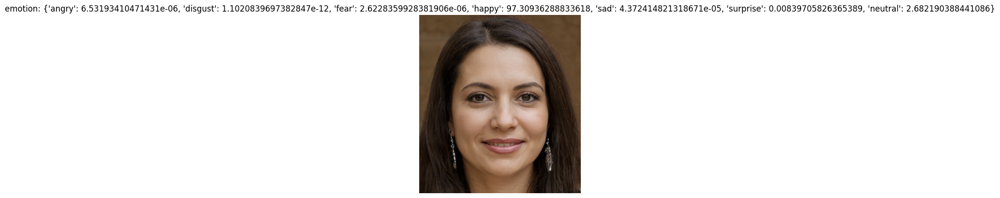

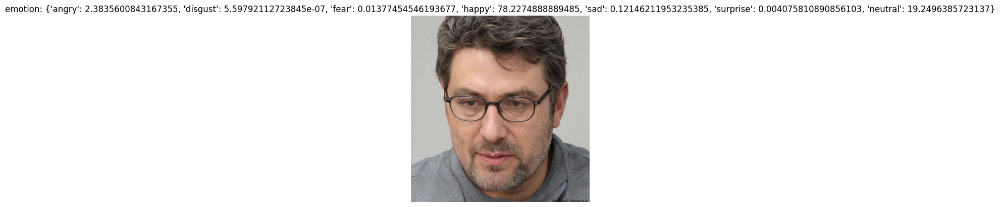

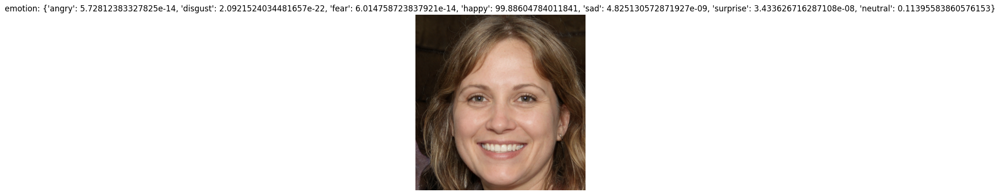

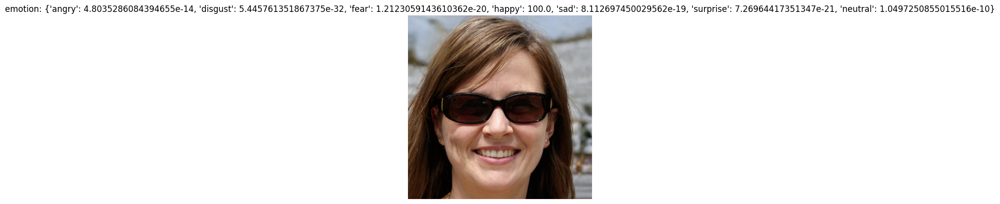

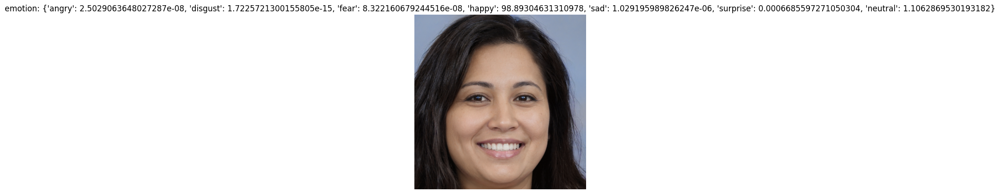

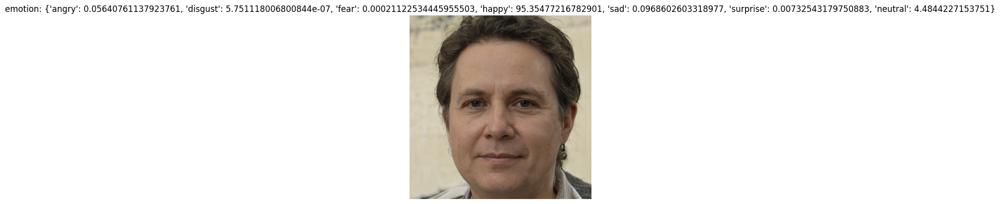

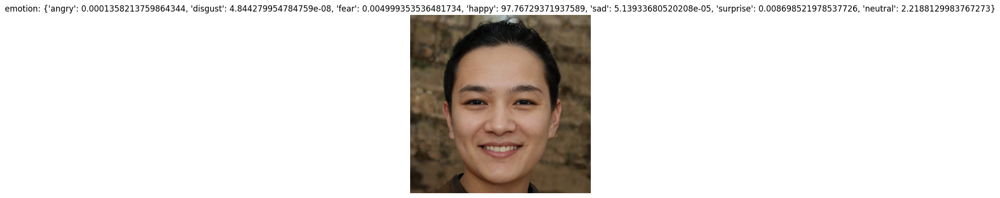

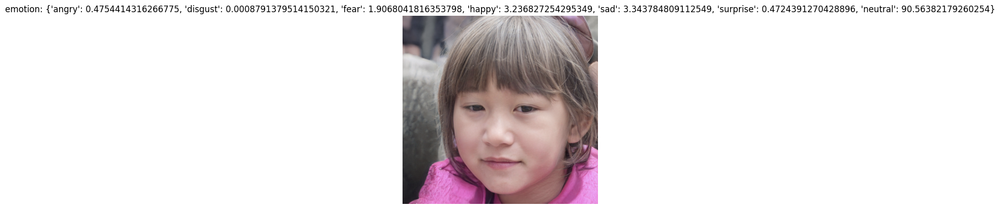

In [28]:
for path in images_paths:
    result = DeepFace.analyze(img_path=path,
                          actions=['emotion'])
    visualize_attribute(img_path=path,
                    result=result,
                    attribute="emotion")

# Detect All

In [30]:
DeepFace.analyze(img_path=img_path,
                 actions=['age','gender','race','emotion'])

Action: emotion: 100%|██████████| 4/4 [00:00<00:00,  7.99it/s]


[{'age': 32,
  'region': {'x': 307,
   'y': 396,
   'w': 1408,
   'h': 1408,
   'left_eye': (1235, 958),
   'right_eye': (723, 959)},
  'face_confidence': 0.91,
  'gender': {'Woman': 99.99967813491821, 'Man': 0.00032630750865791924},
  'dominant_gender': 'Woman',
  'race': {'asian': 27.15032696723938,
   'indian': 21.47870808839798,
   'black': 10.993955284357071,
   'white': 5.8914948254823685,
   'middle eastern': 6.343282014131546,
   'latino hispanic': 28.142231702804565},
  'dominant_race': 'latino hispanic',
  'emotion': {'angry': 2.5029063648027287e-08,
   'disgust': 1.7225721300155805e-15,
   'fear': 8.322160679244516e-08,
   'happy': 98.89304631310978,
   'sad': 1.029195989826247e-06,
   'surprise': 0.0006685597271050304,
   'neutral': 1.1062869530193182},
  'dominant_emotion': 'happy'}]

In [31]:
DeepFace.analyze(img_path=img_path,
                 actions=['gender'])

[{'gender': {'Woman': 99.99967813491821, 'Man': 0.00032630750865791924},
  'dominant_gender': 'Woman',
  'region': {'x': 307,
   'y': 396,
   'w': 1408,
   'h': 1408,
   'left_eye': (1235, 958),
   'right_eye': (723, 959)},
  'face_confidence': 0.91}]

In [33]:
result = DeepFace.analyze(img_path=img_path,
                 actions=['gender'])

In [35]:
type(result)

list

In [34]:
result['dominant_gender']

TypeError: list indices must be integers or slices, not str